In [1]:
import Pkg
Pkg.activate(".");

  Activating project at `~/Documents/MPSTime.jl`


In [7]:
using Plots
using MPSTime
using Random
using StatsBase
using StatsPlots
using Distributions
using LaTeXStrings
using JLD2
using Plots.PlotMeasures
using ProgressMeter
default(;fontfamily = "Arial", xtickfont=18, ytickfont=18, guidefont=18, 
    bottom_margin=8mm, left_margin=8mm, right_margin=8mm, titlefont=18, c=palette(:tab10))

In [3]:
#Threads.nthreads()

# Setup NTS

8 intervals in the domain [0, 2pi)

In [8]:
T = 100 # time series length
intervals = 8
sample_pts = [2pi * k/intervals for k in 0:intervals-1]
n_train = 1000 # number of time series instances
period = 30.0 # fix the period
slope = 1.0 # fix the slope
sigma = 0.1 # fix the noise to std. dev of 0.1
train, train_info = trendy_sine(T, n_train; period=period, slope=slope, phase=sample_pts, sigma=sigma, rng=Xoshiro(485));
opts = MPSOptions(d=10, chi_max=60, nsweeps=20, eta=0.1, sigmoid_transform=false);

Fit the MPS to fixed phases

In [165]:
# mps, _, _ = fitMPS(train, opts)

3-element Vector{Any}:
 TrainedMPS(ITensors.ITensorMPS.MPS
[1] ((dim=10|id=399|"Site,n=1"), (dim=10|id=647|"Link,l=1"))
[2] ((dim=10|id=390|"Site,n=2"), (dim=10|id=647|"Link,l=1"), (dim=52|id=697|"Link,l=2"))
[3] ((dim=10|id=367|"Site,n=3"), (dim=52|id=697|"Link,l=2"), (dim=60|id=134|"Link,l=3"))
[4] ((dim=10|id=420|"Site,n=4"), (dim=60|id=134|"Link,l=3"), (dim=60|id=90|"Link,l=4"))
[5] ((dim=10|id=359|"Site,n=5"), (dim=60|id=90|"Link,l=4"), (dim=60|id=161|"Link,l=5"))
[6] ((dim=10|id=118|"Site,n=6"), (dim=60|id=161|"Link,l=5"), (dim=60|id=287|"Link,l=6"))
[7] ((dim=10|id=168|"Site,n=7"), (dim=60|id=287|"Link,l=6"), (dim=60|id=846|"Link,l=7"))
[8] ((dim=10|id=895|"Site,n=8"), (dim=60|id=846|"Link,l=7"), (dim=60|id=672|"Link,l=8"))
[9] ((dim=10|id=878|"Site,n=9"), (dim=60|id=672|"Link,l=8"), (dim=60|id=942|"Link,l=9"))
[10] ((dim=10|id=378|"Site,n=10"), (dim=60|id=942|"Link,l=9"), (dim=60|id=142|"Link,l=10"))
[11] ((dim=10|id=194|"Site,n=11"), (dim=60|id=142|"Link,l=10"), (dim=60|id=167

In [157]:
f = jldopen("mps_generalization.jld2");
mps = read(f, "mps");

Generate 5000 uniformly spaced test phases over the interval [0, 2pi).

In [9]:
n_test = 5000
phase_test = collect(LinRange(0, 2pi, n_test))
test = Matrix{Float64}(undef, n_test, T)
test_phases = Vector{Float64}(undef, n_test)
for i in 1:n_test
    inst, inf = trendy_sine(T, 1; period=period, slope=slope, phase=phase_test[i], sigma=sigma);
    test_phases[i] = inf[:phase][1]
    test[i, :] = inst
end

Also generate noise-free ground truth baseline

In [10]:
nf_gt = Matrix{Float64}(undef, n_test, T)
for i in 1:n_test
    inst, inf = trendy_sine(T, 1; period=period, slope=slope, phase=phase_test[i], sigma=0.0);
    nf_gt[i, :] = inst
end

In [11]:
println("Resolution of: $((rad2deg(diff(phase_test)[1]))) degrees")

Resolution of: 0.07201440288057612 degrees


In [161]:
rand(Xoshiro(43), 1:1000)

162

In [197]:
# get the idx of the nearest training phase for each ground truth
sample_pts_new = vcat(sample_pts, 2pi) # so that maps back around
gt_phase_idxs = [argmin(abs.(test_phases[i] .- sample_pts_new)) for i in 1:length(test_phases)]
# use these to generate the NTS
nfnn = Matrix{Float64}(undef, n_test, T)
for i in 1:n_test
    inst, inf = trendy_sine(T, 1; period=period, slope=slope, phase=sample_pts_new[gt_phase_idxs[i]], sigma=0.0);
    nfnn[i, :] = inst
end

In [163]:
imp = init_imputation_problem(mps, test, verbosity=0);
class = 0
method = :median
pm = 0.5 # 50% data missing
score_mps = Vector{Float64}(undef, size(test, 1))
score_nn = Vector{Float64}(undef, size(test, 1))
score_nfgt = Vector{Float64}(undef, size(test, 1)) # noise-free true model 
score_nfgt_nfnn = Vector{Float64}(undef, size(test, 1)) # noise-free gt and noise-free nearest neighbor
meta_rng = Xoshiro(34) # RNG which controls the other rng
thread_rngs = [Xoshiro(rand(meta_rng, 1:999999)) for _ in 1:size(test, 1)]
@showprogress Threads.@threads for i in 1:size(test, 1)
    _, impute_sites = mar(test[i, :], pm; rng=thread_rngs[i])
    stats = MPS_impute(imp, class, i, impute_sites, method; NN_baseline=true, plot_fits=false)[4]
    nfgt_error = MPSTime.mae(nf_gt[i, impute_sites], test[i, impute_sites])
    nfgt_nfnn_error = MPSTime.mae(nf_gt[i, impute_sites], nfnn[i, impute_sites])
    # extract errors
    mae_mps = stats[1][:MPS_MAE]
    mae_nn = stats[2][:NN_MAE]

    score_mps[i] = mae_mps
    score_nn[i] = mae_nn
    score_nfgt[i] = nfgt_error
    score_nfgt_nfnn[i] = nfgt_nfnn_error
end

Initialising train states.


Progress:  37%|███████████████▎                         |  ETA: 4:08:10K

The test set couldn't be perfectly rescaled by the training set normalization, 1 additional rescaling operations had to be performed!
The test set couldn't be perfectly rescaled by the training set normalization, 1 additional rescaling operations had to be performed!


Progress:  37%|███████████████▍                         |  ETA: 4:06:58

The test set couldn't be perfectly rescaled by the training set normalization, 1 additional rescaling operations had to be performed!
The test set couldn't be perfectly rescaled by the training set normalization, 1 additional rescaling operations had to be performed!


Progress:  52%|█████████████████████▌                   |  ETA: 9:19:52

The test set couldn't be perfectly rescaled by the training set normalization, 1 additional rescaling operations had to be performed!
The test set couldn't be perfectly rescaled by the training set normalization, 1 additional rescaling operations had to be performed!
The test set couldn't be perfectly rescaled by the training set normalization, 1 additional rescaling operations had to be performed!
The test set couldn't be perfectly rescaled by the training set normalization, 1 additional rescaling operations had to be performed!


Progress:  54%|██████████████████████                   |  ETA: 10:21:16

The test set couldn't be perfectly rescaled by the training set normalization, 1 additional rescaling operations had to be performed!


Progress:  54%|██████████████████████▏                  |  ETA: 10:52:05

The test set couldn't be perfectly rescaled by the training set normalization, 1 additional rescaling operations had to be performed!


Progress:  59%|████████████████████████▏                |  ETA: 9:01:30K

The test set couldn't be perfectly rescaled by the training set normalization, 1 additional rescaling operations had to be performed!


Progress:  59%|████████████████████████▏                |  ETA: 8:58:09

The test set couldn't be perfectly rescaled by the training set normalization, 1 additional rescaling operations had to be performed!


Progress:  70%|████████████████████████████▉            |  ETA: 5:35:06

The test set couldn't be perfectly rescaled by the training set normalization, 1 additional rescaling operations had to be performed!
The test set couldn't be perfectly rescaled by the training set normalization, 1 additional rescaling operations had to be performed!
The test set couldn't be perfectly rescaled by the training set normalization, 1 additional rescaling operations had to be performed!
The test set couldn't be perfectly rescaled by the training set normalization, 1 additional rescaling operations had to be performed!


Progress:  85%|██████████████████████████████████▊      |  ETA: 2:28:26Excessive output truncated after 524829 bytes.

In [251]:
thread_rngs = [Xoshiro(rand(meta_rng, 1:999999)) for _ in 1:size(test, 1)]
score_nfgt_nfnn = Vector{Float64}(undef, size(test, 1))
for i in 1:size(test, 1)
    _, impute_sites = mar(test[i, :], pm; rng=Xoshiro(13))
    nfgt_nfnn_error = MPSTime.mae(nf_gt[i, impute_sites], nfnn[i, impute_sites])
    score_nfgt_nfnn[i] = nfgt_nfnn_error
end

generate phase nearest neighbour - this would just be the MAE between the noise-free nearest neighbour in the training set and the noise-free correct phase. Generate a NTS using nearest neighbour phase, generate NTS using nois-free ground truth, compute MAE between them.

In [45]:
#JLD2.@save "phase_generalisation_results.jld2" score_mps score_nn score_nfgt

In [165]:
#JLD2.@save "phase_generalisation_results2.jld2" score_mps score_nn score_nfgt score_nfgt_nfnn

In [4]:
@load "phase_generalisation_results.jld2" 

3-element Vector{Symbol}:
 :score_mps
 :score_nn
 :score_nfgt

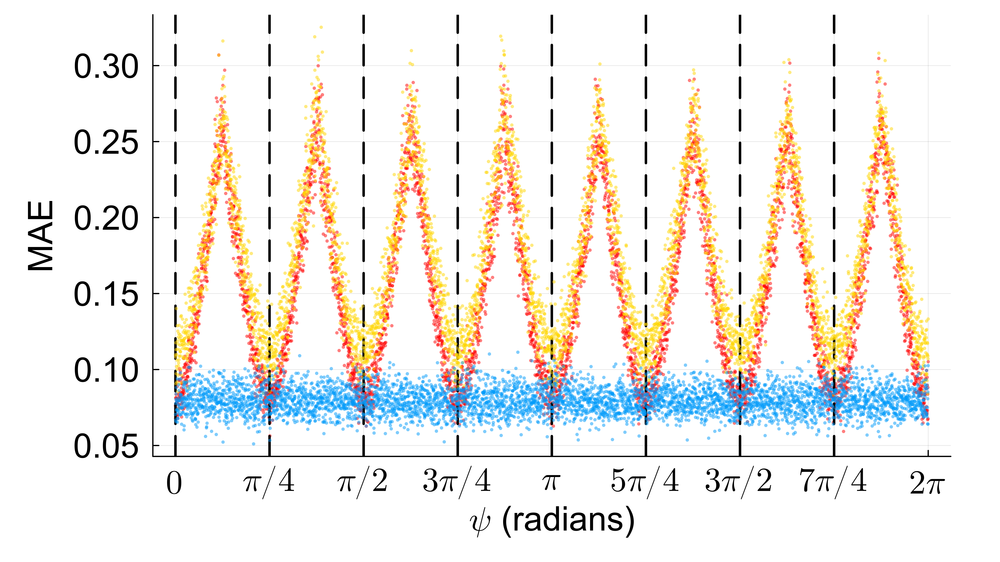

In [114]:
xtick_positions = 0:pi/4:2pi
xtick_labels = [L"0", L"$\pi/4$", L"$\pi/2$", L"3\pi/4", L"\pi", L"5\pi/4", L"3\pi/2", L"7\pi/4", L"2\pi"]
scatter(test_phases, score_mps, c=:red, label="MPSTime", msw=0, size=(800, 450), ms=1.5, legend=:none,
   legend_columns=1, background_color_legend=nothing, legendfont=font("Arial", 10), alpha=0.5, dpi=800) # (1200, 500)
    #title="$intervals Interval Phase Generalisation, $(pm*100)% data missing imputation")
xticks!(xtick_positions, xtick_labels)
vline!([sample_pts], ls=:dash, c=:black, lw=2, label="")
#plot!(test_phases, score_mps, c=1, label="", lw=0.05)
scatter!(test_phases, score_nn, c=:gold, label="1-NNI", msw=0, ms=1.5, alpha=0.5)
#plot!(test_phases, score_nn, c=2, label="", lw=0.1)
scatter!(test_phases, score_nfgt, c=1, label="ground truth", msw=0, ms=1.5, alpha=0.5)
xlabel!(L"$\psi$ (radians)")
ylabel!("MAE")
#plot!(test_phases, score_nfgt, c=3, label="", lw=0.1)
#savefig("8interval_generalisation_sigma_01_layout3.png")

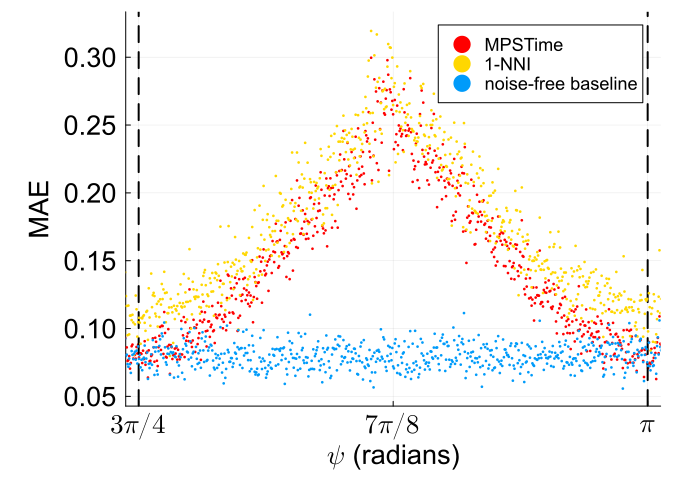

In [117]:
fstyle = font("Arial", )
xtick_positions = 3pi/4:pi/8:pi
xtick_labels = [L"3\pi/4", L"$7\pi/8$", L"$\pi$"]
scatter(test_phases, score_mps, c=:red, label="MPSTime", msw=0, size=(700, 500), ms=1.5, legend=:topright,
   legend_columns=1, background_color_legend=:white, legendfont=font("Arial", 12), xlims=(3pi/4-0.02, pi+0.02))
    #title="$intervals Interval Phase Generalisation, $(pm*100)% data missing imputation")
xticks!(xtick_positions, xtick_labels)
vline!([sample_pts], ls=:dash, c=:black, lw=2, label="")
#plot!(test_phases, score_mps, c=1, label="", lw=0.05)
scatter!(test_phases, score_nn, c=:gold, label="1-NNI", msw=0, ms=1.5)
# #plot!(test_phases, score_nn, c=2, label="", lw=0.1)
scatter!(test_phases, score_nfgt, c=1, label="noise-free baseline", msw=0, ms=1.5)
xlabel!(L"$\psi$ (radians)")
ylabel!("MAE")
#savefig("8interval_generalisation_sigma_01_layout3_zoomed.svg")

In [ ]:
xtick_positions = 0:pi/4:2pi
xtick_labels = [L"0", L"$\pi/4$", L"$\pi/2$", L"3\pi/4", L"\pi", L"5\pi/4", L"3\pi/2", L"7\pi/4", L"2\pi"]
scatter(test_phases, score_mps, c=:red, label="MPSTime", msw=0, size=(1200, 500), ms=1.5, legend=:none,
   legend_columns=1, background_color_legend=nothing, legendfont=font("Arial", 10))
    #title="$intervals Interval Phase Generalisation, $(pm*100)% data missing imputation")
xticks!(xtick_positions, xtick_labels)
vline!([sample_pts], ls=:dash, c=:black, lw=2, label="")
#plot!(test_phases, score_mps, c=1, label="", lw=0.05)
scatter!(test_phases, score_nn, c=:gold, label="1-NNI", msw=0, ms=1.5)
#plot!(test_phases, score_nn, c=2, label="", lw=0.1)
scatter!(test_phases, score_nfgt, c=1, label="ground truth", msw=0, ms=1.5)
xlabel!(L"$\psi$ (radians)")
ylabel!("MAE")

Window-location averaged version:

In [154]:
# imp = init_imputation_problem(mps, test, verbosity=0);
# class = 0
# method = :median
# iters = 5 # average over number of window locations 
# pm = 0.5 # 50% data missing
# score_mps = Vector{Float64}(undef, size(test, 1))
# score_nn = Vector{Float64}(undef, size(test, 1))
# meta_rng = Xoshiro(34) # RNG which controls the other rng aka META RNG :)
# for (idx, instance) in enumerate(1:size(test, 1))
#     window_loc_err_mps = Vector{Float64}(undef, iters)
#     window_loc_err_nn = Vector{Float64}(undef, iters)
#     # pre-allocate each rng before threading to ensure reproducibility
#     iter_rngs = [Xoshiro(rand(meta_rng, 1:999999999)) for _ in 1:iters]
#     Threads.@threads for ite in 1:iters
#         _, impute_sites = mar(test[instance, :], pm; rng=iter_rngs[ite])
#         @show impute_sites
#         stats = MPS_impute(imp, class, instance, impute_sites, method; NN_baseline=true, plot_fits=false)[4]
#         # extract errors
#         mae_mps = stats[1][:MPS_MAE]
#         mae_nn = stats[2][:NN_MAE]

#         window_loc_err_mps[ite] = mae_mps
#         window_loc_err_nn[ite] = mae_nn
#     end
#     # take means across window locations 
#     score_mps[idx] = mean(window_loc_err_mps)
#     score_nn[idx] = mean(window_loc_err_nn)
# end

Initialising train states.
impute_sites = [27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76]
impute_sites = [42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91]
impute_sites = [6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
impute_sites = [36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85]
impute_sites = [51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 7

Excessive output truncated after 524401 bytes.

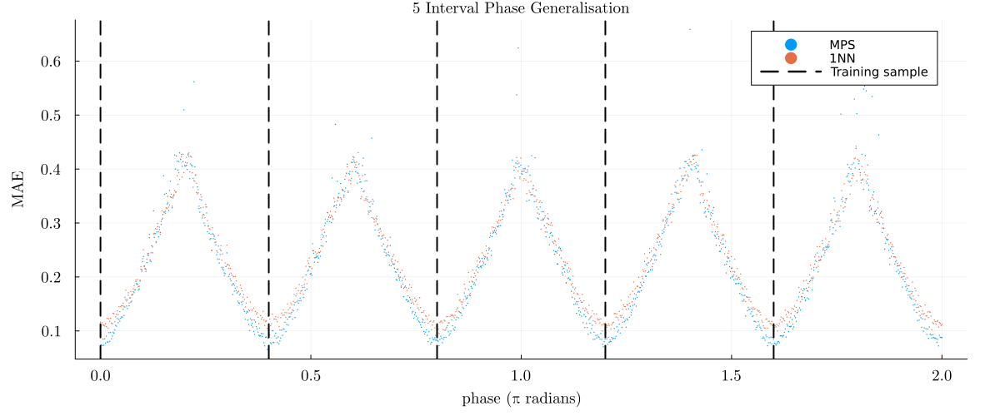

In [162]:
# scatter(test_phases./pi, score_mps, c=1, label="MPS", msw=0, size=(1200, 500), 
#     title="5 Interval Phase Generalisation", legendfont=font(10), ms=0.8)
# #plot!(test_phases./pi, score_mps, c=1)
# scatter!(test_phases./pi, score_nn, c=2, label="1NN", msw=0, ms=0.8)
# #plot!(test_phases./pi, score_nn, c=2)
# vline!([sample_pts/pi], ls=:dash, c=:black, lw=2, label="Training sample")
# xlabel!("phase (π radians)")
# ylabel!("MAE")

# Noise-free setting

In [87]:
T = 100 # time series length
intervals = 8
sample_pts = [2pi * k/intervals for k in 0:intervals-1]
n_train = 1000 # number of time series instances
period = 30.0 # fix the period
slope = 1.0 # fix the slope
sigma = 0.0 # fix the noise to std. dev of 0.1
train, train_info = trendy_sine(T, n_train; period=period, slope=slope, phase=sample_pts, sigma=sigma, rng=Xoshiro(485));
opts = MPSOptions(d=10, chi_max=60, nsweeps=20, eta=0.1, sigmoid_transform=false);

In [88]:
mps, _, _ = fitMPS(train, opts)

3-element Vector{Any}:
 TrainedMPS(ITensors.ITensorMPS.MPS
[1] ((dim=10|id=515|"Site,n=1"), (dim=8|id=390|"Link,l=1"))
[2] ((dim=10|id=152|"Site,n=2"), (dim=8|id=390|"Link,l=1"), (dim=8|id=407|"Link,l=2"))
[3] ((dim=10|id=802|"Site,n=3"), (dim=8|id=407|"Link,l=2"), (dim=8|id=638|"Link,l=3"))
[4] ((dim=10|id=194|"Site,n=4"), (dim=8|id=638|"Link,l=3"), (dim=8|id=192|"Link,l=4"))
[5] ((dim=10|id=688|"Site,n=5"), (dim=8|id=192|"Link,l=4"), (dim=8|id=842|"Link,l=5"))
[6] ((dim=10|id=968|"Site,n=6"), (dim=8|id=842|"Link,l=5"), (dim=8|id=267|"Link,l=6"))
[7] ((dim=10|id=378|"Site,n=7"), (dim=8|id=267|"Link,l=6"), (dim=8|id=460|"Link,l=7"))
[8] ((dim=10|id=919|"Site,n=8"), (dim=8|id=460|"Link,l=7"), (dim=8|id=746|"Link,l=8"))
[9] ((dim=10|id=973|"Site,n=9"), (dim=8|id=746|"Link,l=8"), (dim=8|id=663|"Link,l=9"))
[10] ((dim=10|id=16|"Site,n=10"), (dim=8|id=663|"Link,l=9"), (dim=8|id=11|"Link,l=10"))
[11] ((dim=10|id=187|"Site,n=11"), (dim=8|id=11|"Link,l=10"), (dim=8|id=10|"Link,l=11"))
[12] ((d

In [107]:
n_test = 5000
phase_test = collect(LinRange(0, 2pi, n_test))
test = Matrix{Float64}(undef, n_test, T)
test_phases = Vector{Float64}(undef, n_test)
for i in 1:n_test
    inst, inf = trendy_sine(T, 1; period=period, slope=slope, phase=phase_test[i], sigma=sigma);
    test_phases[i] = inf[:phase][1]
    test[i, :] = inst
end

In [108]:
nf_gt = Matrix{Float64}(undef, n_test, T)
for i in 1:n_test
    inst, inf = trendy_sine(T, 1; period=period, slope=slope, phase=phase_test[i], sigma=0.0);
    nf_gt[i, :] = inst
end

In [109]:
imp = init_imputation_problem(mps, test, verbosity=0);
class = 0
method = :median
pm = 0.5 # 50% data missing
score_mps = Vector{Float64}(undef, size(test, 1))
score_nn = Vector{Float64}(undef, size(test, 1))
score_nfgt = Vector{Float64}(undef, size(test, 1)) # noise-free true model 
meta_rng = Xoshiro(34) # RNG which controls the other rng
thread_rngs = [Xoshiro(rand(meta_rng, 1:999999)) for _ in 1:size(test, 1)]
@showprogress Threads.@threads for i in 1:size(test, 1)
    _, impute_sites = mar(test[i, :], pm; rng=thread_rngs[i])
    stats = MPS_impute(imp, class, i, impute_sites, method; NN_baseline=true, plot_fits=false)[4]
    nfgt_error = MPSTime.mae(nf_gt[i, impute_sites], test[i, impute_sites])
    # extract errors
    mae_mps = stats[1][:MPS_MAE]
    mae_nn = stats[2][:NN_MAE]

    score_mps[i] = mae_mps
    score_nn[i] = mae_nn
    score_nfgt[i] = nfgt_error
end

In [453]:
@load "phase_generalisation_results_noise_free.jld2"

3-element Vector{Symbol}:
 :score_mps
 :score_nn
 :score_nfgt

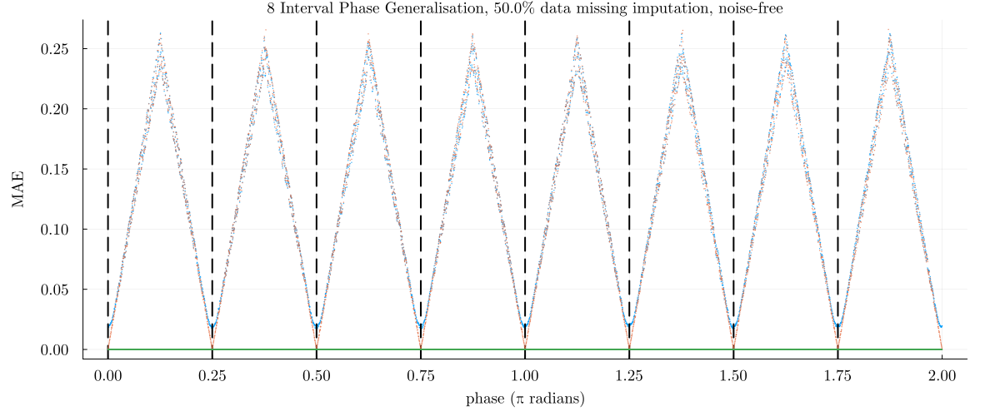

In [460]:
scatter(test_phases./pi, score_mps, c=1, label="MPS", msw=0, size=(1200, 500), 
    title="$intervals Interval Phase Generalisation, $(pm*100)% data missing imputation, noise-free", legendfont=font(10), ms=0.8,
    legend=:none, xticks=collect(0:0.25:2.0), alpha=0.8)
vline!([sample_pts/pi], ls=:dash, c=:black, lw=2, label="")
#plot!(test_phases./pi, score_mps, c=1, label="", lw=0.1, alpha=0.5)
scatter!(test_phases./pi, score_nn, c=2, label="1NN", msw=0, ms=0.8, alpha=0.8)
#plot!(test_phases./pi, score_nn, c=2, label="", lw=0.1, alpha=0.5)
scatter!(test_phases./pi, score_nfgt, c=3, label="Ideal", msw=0, ms=0.8, alpha=0.8)
#plot!(test_phases./pi, score_nfgt, c=3, label="", lw=0.1, alpha=0.5)
xlabel!("phase (π radians)")
ylabel!("MAE")
#savefig("8interval_generalisation_noise-free_nolines.svg")

In [437]:
#JLD2.@save "phase_generalisation_results_noise_free.jld2" score_mps score_nn score_nfgt

In [148]:
rand([0.1, 0.2])

0.2

In [280]:
function get_weights(x, dx)
    return [(1 + cos(pi*(x/dx)))/2, (1 - cos(pi*(x/dx)))/2]
end

get_weights (generic function with 2 methods)

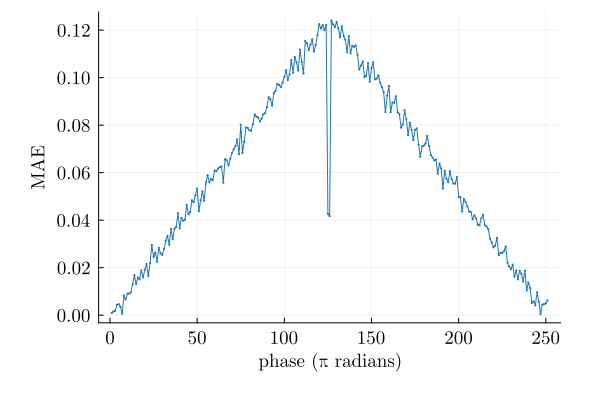

In [432]:
# focus on interval 0, 0.25 pi radians 
eval_pts = 0.0:0.001:0.25
function surrogate_model(phase::Float64, windows_per_instance::Int=3)
    # simulate the behaviour
    dx = 0.002
    window_scores = []
    for w in 1:windows_per_instance
        if phase ≤ 0.125 - dx 
            push!(window_scores, 0.0 + 0.005*randn())
        elseif phase ≥ 0.125 + dx
            push!(window_scores, 0.25 + 0.005*randn())
        else
            # flick between both randomly 
            # weights depend on location in interval dx
            x = phase - 0.125 # should lie between 0 and dx
            w = get_weights(x, dx)
            push!(window_scores, sample([0.0, 0.25], Weights([0.3, 0.8])))
        end
    end 
    return mean(window_scores)
end
preds = surrogate_model.(eval_pts);
maes = abs.(eval_pts - preds);
scatter(maes, ms=1.2, msw=0, label="", xlabel="phase (π radians)", ylabel="MAE")
plot!(maes, label="")